# Simple object detection

```This simple object detection model was done to figure out and get familiar with the detectron2 environment```

In [122]:
!nvidia-smi

Mon Oct 25 09:33:09 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.91.03    Driver Version: 460.91.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  CUDA GPU            Off  | 00000000:0F:00.0 Off |                  N/A |
| 23%   24C    P8     8W / 250W |   7963MiB /  8130MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [123]:
!python -m pip install detectron2 -f \
  https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.9/index.html

Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.9/index.html


In [124]:
pip install -U albumentations

Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.


In [125]:
import numpy as np 
import pandas as pd 

import torch
import torchvision
import albumentations as A


import detectron2
from detectron2.data.transforms import Transform as T
from detectron2.data.datasets import register_coco_instances
from detectron2.data import transforms as T
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog, DatasetMapper, build_detection_test_loader , build_detection_train_loader
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import detection_utils as utils
from detectron2.config import configurable
from detectron2.engine.hooks import EvalHook
from detectron2.modeling import build_model
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.utils.logger import setup_logger
from detectron2.config import get_cfg
setup_logger()


from sklearn.model_selection import KFold,StratifiedKFold,StratifiedShuffleSplit,GroupKFold
from sklearn.model_selection import train_test_split
from sklearn.utils import check_random_state
from collections import Counter, defaultdict #dictionaries and defualtdict are almost same except for the 
#fact that defualtdict never raises a KeyError. It provides a default value for the key that does not exists.
import matplotlib.pyplot as plt
import cv2
import json
import io
import os
import copy
import random
import yaml
from yacs.config import CfgNode as CN

In [126]:
os.getcwd()

'/home/work/Recycling'

In [127]:
DATASET_PATH = "/home/work/Recycling/data/"
LOGS_PATH = "logs"
MODELS_PATH = "models"
CONFIG_PATH = "configs"

In [128]:
annot=json.load(open(os.path.join(DATASET_PATH,"labels.json")))
annot["annotations"][308]["id"]=0
annot["annotations"][4039]["id"]=2197

In [129]:
annot_to_delete=[]
for idx,annotation in enumerate(annot["annotations"]):
    if (annotation["bbox"][0]<0 or annotation["bbox"][1]<0 or
        annotation["bbox"][2]<0 or annotation["bbox"][3]<0):
        annot_to_delete.append(idx)
for pos,idx in enumerate(annot_to_delete):
    del annot["annotations"][idx-pos]

In [130]:
annot.keys()

dict_keys(['info', 'images', 'annotations', 'scene_annotations', 'licenses', 'categories', 'scene_categories'])

In [131]:
print(annot['images'][0], '\n', annot['annotations'][0], '\n', annot['categories'][0])

{'id': 0, 'width': 1537, 'height': 2049, 'file_name': 'batch_1/000006.jpg', 'license': None, 'flickr_url': 'https://farm66.staticflickr.com/65535/33978196618_e30a59e0a8_o.png', 'coco_url': None, 'date_captured': None, 'flickr_640_url': 'https://farm66.staticflickr.com/65535/33978196618_632623b4fc_z.jpg'} 
 {'id': 1, 'image_id': 0, 'category_id': 6, 'segmentation': [[561.0, 1238.0, 568.0, 1201.0, 567.0, 1175.0, 549.0, 1127.0, 538.0, 1089.0, 519.0, 1043.0, 517.0, 1005.0, 523.0, 964.0, 529.0, 945.0, 520.0, 896.0, 525.0, 862.0, 536.0, 821.0, 554.0, 769.0, 577.0, 727.0, 595.0, 678.0, 596.0, 585.0, 588.0, 346.0, 581.0, 328.0, 569.0, 306.0, 570.0, 276.0, 576.0, 224.0, 560.0, 205.0, 564.0, 170.0, 578.0, 154.0, 608.0, 136.0, 649.0, 127.0, 688.0, 127.0, 726.0, 129.0, 759.0, 141.0, 784.0, 153.0, 792.0, 177.0, 788.0, 193.0, 782.0, 209.0, 792.0, 238.0, 802.0, 271.0, 802.0, 294.0, 791.0, 319.0, 789.0, 360.0, 794.0, 395.0, 810.0, 529.0, 819.0, 609.0, 841.0, 675.0, 882.0, 728.0, 916.0, 781.0, 928.0, 8

In [133]:
categories={annotation["id"] : annotation["name"] for annotation in annot["categories"]}
super_categories={annotation["id"] : annotation["supercategory"] for annotation in annot["categories"]}

In [134]:
categories #Categories availabe on the json document

{0: 'Aluminium foil',
 1: 'Battery',
 2: 'Aluminium blister pack',
 3: 'Carded blister pack',
 4: 'Other plastic bottle',
 5: 'Clear plastic bottle',
 6: 'Glass bottle',
 7: 'Plastic bottle cap',
 8: 'Metal bottle cap',
 9: 'Broken glass',
 10: 'Food Can',
 11: 'Aerosol',
 12: 'Drink can',
 13: 'Toilet tube',
 14: 'Other carton',
 15: 'Egg carton',
 16: 'Drink carton',
 17: 'Corrugated carton',
 18: 'Meal carton',
 19: 'Pizza box',
 20: 'Paper cup',
 21: 'Disposable plastic cup',
 22: 'Foam cup',
 23: 'Glass cup',
 24: 'Other plastic cup',
 25: 'Food waste',
 26: 'Glass jar',
 27: 'Plastic lid',
 28: 'Metal lid',
 29: 'Other plastic',
 30: 'Magazine paper',
 31: 'Tissues',
 32: 'Wrapping paper',
 33: 'Normal paper',
 34: 'Paper bag',
 35: 'Plastified paper bag',
 36: 'Plastic film',
 37: 'Six pack rings',
 38: 'Garbage bag',
 39: 'Other plastic wrapper',
 40: 'Single-use carrier bag',
 41: 'Polypropylene bag',
 42: 'Crisp packet',
 43: 'Spread tub',
 44: 'Tupperware',
 45: 'Disposable 

In [135]:
super_categories

{0: 'Aluminium foil',
 1: 'Battery',
 2: 'Blister pack',
 3: 'Blister pack',
 4: 'Bottle',
 5: 'Bottle',
 6: 'Bottle',
 7: 'Bottle cap',
 8: 'Bottle cap',
 9: 'Broken glass',
 10: 'Can',
 11: 'Can',
 12: 'Can',
 13: 'Carton',
 14: 'Carton',
 15: 'Carton',
 16: 'Carton',
 17: 'Carton',
 18: 'Carton',
 19: 'Carton',
 20: 'Cup',
 21: 'Cup',
 22: 'Cup',
 23: 'Cup',
 24: 'Cup',
 25: 'Food waste',
 26: 'Glass jar',
 27: 'Lid',
 28: 'Lid',
 29: 'Other plastic',
 30: 'Paper',
 31: 'Paper',
 32: 'Paper',
 33: 'Paper',
 34: 'Paper bag',
 35: 'Paper bag',
 36: 'Plastic bag & wrapper',
 37: 'Plastic bag & wrapper',
 38: 'Plastic bag & wrapper',
 39: 'Plastic bag & wrapper',
 40: 'Plastic bag & wrapper',
 41: 'Plastic bag & wrapper',
 42: 'Plastic bag & wrapper',
 43: 'Plastic container',
 44: 'Plastic container',
 45: 'Plastic container',
 46: 'Plastic container',
 47: 'Plastic container',
 48: 'Plastic glooves',
 49: 'Plastic utensils',
 50: 'Pop tab',
 51: 'Rope & strings',
 52: 'Scrap metal',
 

In [136]:
annot_df=pd.DataFrame(annot["annotations"])
images_df=pd.DataFrame(annot["images"])

In [137]:
annot_df.head()

,id,image_id,category_id,segmentation,area,bbox,iscrowd
0,1,0,6,"[[561.0, 1238.0, 568.0, 1201.0, 567.0, 1175.0,...",403954.0,"[517.0, 127.0, 447.0, 1322.0]",0
1,2,1,18,"[[928.0, 1876.0, 938.0, 1856.0, 968.0, 1826.0,...",1071259.5,"[1.0, 457.0, 1429.0, 1519.0]",0
2,3,1,14,"[[617.0, 383.0, 703.0, 437.0, 713.0, 456.0, 72...",99583.5,"[531.0, 292.0, 1006.0, 672.0]",0
3,4,2,5,"[[670.0, 993.0, 679.0, 998.0, 684.0, 1001.0, 6...",73832.5,"[632.0, 987.0, 500.0, 374.0]",0
4,5,2,7,"[[647.0, 1028.0, 650.0, 1022.0, 653.0, 1016.0,...",915.0,"[632.0, 989.0, 44.0, 51.0]",0


In [138]:
images_df.head()

,id,width,height,file_name,license,flickr_url,coco_url,date_captured,flickr_640_url
0,0,1537,2049,batch_1/000006.jpg,None,https://farm66.staticflickr.com/65535/33978196...,None,None,https://farm66.staticflickr.com/65535/33978196...
1,1,1537,2049,batch_1/000008.jpg,None,https://farm66.staticflickr.com/65535/47803331...,None,None,https://farm66.staticflickr.com/65535/47803331...
2,2,1537,2049,batch_1/000010.jpg,None,https://farm66.staticflickr.com/65535/40888872...,None,None,https://farm66.staticflickr.com/65535/40888872...
3,3,2049,1537,batch_1/000019.jpg,None,https://farm66.staticflickr.com/65535/47803331...,None,None,https://farm66.staticflickr.com/65535/47803331...
4,4,1537,2049,batch_1/000026.jpg,None,https://farm66.staticflickr.com/65535/33978199...,None,None,https://farm66.staticflickr.com/65535/33978199...


In [139]:
annot_df["category"]=annot_df["category_id"].apply(lambda value : categories[value])
annot_df["super_category"]=annot_df["category_id"].apply(lambda value : super_categories[value])

In [140]:
super_category_to_index={value : key for key,value in enumerate(annot_df["super_category"].unique())} #there are repeated
annot_df["super_category_id"]=annot_df["super_category"].apply(lambda value : super_category_to_index[value])

In [141]:
#categories as the dataframe order
categories = {}
for id , name in zip(annot_df["category_id"],annot_df["category"]):
    categories[id]=name

In [142]:
categories

{6: 'Glass bottle',
 18: 'Meal carton',
 14: 'Other carton',
 5: 'Clear plastic bottle',
 7: 'Plastic bottle cap',
 12: 'Drink can',
 10: 'Food Can',
 4: 'Other plastic bottle',
 50: 'Pop tab',
 11: 'Aerosol',
 23: 'Glass cup',
 39: 'Other plastic wrapper',
 57: 'Styrofoam piece',
 36: 'Plastic film',
 29: 'Other plastic',
 16: 'Drink carton',
 8: 'Metal bottle cap',
 45: 'Disposable food container',
 33: 'Normal paper',
 20: 'Paper cup',
 40: 'Single-use carrier bag',
 31: 'Tissues',
 13: 'Toilet tube',
 42: 'Crisp packet',
 27: 'Plastic lid',
 28: 'Metal lid',
 15: 'Egg carton',
 55: 'Plastic straw',
 34: 'Paper bag',
 21: 'Disposable plastic cup',
 9: 'Broken glass',
 49: 'Plastic utensils',
 26: 'Glass jar',
 25: 'Food waste',
 54: 'Squeezable tube',
 43: 'Spread tub',
 53: 'Shoe',
 38: 'Garbage bag',
 0: 'Aluminium foil',
 37: 'Six pack rings',
 22: 'Foam cup',
 56: 'Paper straw',
 17: 'Corrugated carton',
 58: 'Unlabeled litter',
 2: 'Aluminium blister pack',
 1: 'Battery',
 51: 

In [143]:
annot_df.head()

,id,image_id,category_id,segmentation,area,bbox,iscrowd,category,super_category,super_category_id
0,1,0,6,"[[561.0, 1238.0, 568.0, 1201.0, 567.0, 1175.0,...",403954.0,"[517.0, 127.0, 447.0, 1322.0]",0,Glass bottle,Bottle,0
1,2,1,18,"[[928.0, 1876.0, 938.0, 1856.0, 968.0, 1826.0,...",1071259.5,"[1.0, 457.0, 1429.0, 1519.0]",0,Meal carton,Carton,1
2,3,1,14,"[[617.0, 383.0, 703.0, 437.0, 713.0, 456.0, 72...",99583.5,"[531.0, 292.0, 1006.0, 672.0]",0,Other carton,Carton,1
3,4,2,5,"[[670.0, 993.0, 679.0, 998.0, 684.0, 1001.0, 6...",73832.5,"[632.0, 987.0, 500.0, 374.0]",0,Clear plastic bottle,Bottle,0
4,5,2,7,"[[647.0, 1028.0, 650.0, 1022.0, 653.0, 1016.0,...",915.0,"[632.0, 989.0, 44.0, 51.0]",0,Plastic bottle cap,Bottle cap,2


# Register dataset

In [144]:
#First, devide the data into train and test
train, test = train_test_split(annot_df, test_size = 0.2)

In [145]:
train.head()

,id,image_id,category_id,segmentation,area,bbox,iscrowd,category,super_category,super_category_id
4490,4497,1408,58,"[[410, 1666, 438, 1688, 470, 1666, 435, 1633]]",1650.0,"[409.99999999999994, 1632.9999999999998, 60.0,...",0,Unlabeled litter,Unlabeled litter,21
2568,2576,827,58,"[[828.0, 1665.0, 835.0, 1655.0, 841.0, 1654.0,...",1738.0,"[828.0, 1652.0, 89.0, 57.0]",0,Unlabeled litter,Unlabeled litter,21
2416,2424,727,59,"[[826.0, 264.0, 802.0, 264.0, 800.0, 258.0, 82...",202.0,"[800.0, 254.0, 26.0, 10.0]",0,Cigarette,Cigarette,25
3858,3866,1242,16,"[[2136.0, 999.0, 2127.0, 1017.0, 2131.0, 1023....",1868.0,"[2127.0, 996.0, 72.0, 46.0]",0,Drink carton,Carton,1
965,969,321,59,"[[1.0, 1302.0, 122.0, 1285.0, 122.0, 1312.0, 1...",3509.0,"[1.0, 1285.0, 121.0, 48.0]",0,Cigarette,Cigarette,25


In [146]:
test.head()

,id,image_id,category_id,segmentation,area,bbox,iscrowd,category,super_category,super_category_id
2949,2957,983,34,"[[956.0, 1501.0, 982.0, 1513.0, 1003.0, 1533.0...",210222.0,"[617.0, 1443.0, 555.0, 566.0]",0,Paper bag,Paper bag,13
1315,1319,375,39,"[[821, 1153, 824, 1173, 861, 1212, 865, 1174]]",1189.5,"[821.0, 1153.0, 44.0, 59.0]",0,Other plastic wrapper,Plastic bag & wrapper,6
1148,1152,348,5,"[[1466, 981, 1460, 1002, 1450, 1026, 1453, 104...",9259.0,"[1450.0, 964.0, 62.0, 186.0]",0,Clear plastic bottle,Bottle,0
4140,4147,1321,9,"[[2165, 1517, 2179, 1523, 2203, 1544, 2165, 15...",284.0,"[2165.0, 1517.0, 38.0, 27.0]",0,Broken glass,Broken glass,14
2717,2725,874,30,"[[1724.0, 1543.0, 1745.0, 1569.0, 1763.0, 1595...",569120.5,"[867.0, 1201.0, 968.0, 1116.0]",0,Magazine paper,Paper,10


In [147]:
images_df

,id,width,height,file_name,license,flickr_url,coco_url,date_captured,flickr_640_url
0,0,1537,2049,batch_1/000006.jpg,None,https://farm66.staticflickr.com/65535/33978196...,None,None,https://farm66.staticflickr.com/65535/33978196...
1,1,1537,2049,batch_1/000008.jpg,None,https://farm66.staticflickr.com/65535/47803331...,None,None,https://farm66.staticflickr.com/65535/47803331...
2,2,1537,2049,batch_1/000010.jpg,None,https://farm66.staticflickr.com/65535/40888872...,None,None,https://farm66.staticflickr.com/65535/40888872...
3,3,2049,1537,batch_1/000019.jpg,None,https://farm66.staticflickr.com/65535/47803331...,None,None,https://farm66.staticflickr.com/65535/47803331...
4,4,1537,2049,batch_1/000026.jpg,None,https://farm66.staticflickr.com/65535/33978199...,None,None,https://farm66.staticflickr.com/65535/33978199...
...,...,...,...,...,...,...,...,...,...
1495,1495,1824,4000,batch_9/000095.jpg,CC,https://farm66.staticflickr.com/65535/48701319...,None,None,https://farm66.staticflickr.com/65535/48701319...
1496,1496,1824,4000,batch_9/000096.jpg,CC,https://farm66.staticflickr.com/65535/48701319...,None,None,https://farm66.staticflickr.com/65535/48701319...
1497,1497,4000,1824,batch_9/000097.jpg,CC,https://farm66.staticflickr.com/65535/48694319...,None,None,https://farm66.staticflickr.com/65535/48694319...
1498,1498,1824,4000,batch_9/000098.jpg,CC,https://farm66.staticflickr.com/65535/48693804...,None,None,https://farm66.staticflickr.com/65535/48693804...


In [148]:
tr_annot=annot.copy()

In [149]:
annot['annotations']

[{'id': 1,
  'image_id': 0,
  'category_id': 6,
  'segmentation': [[561.0,
    1238.0,
    568.0,
    1201.0,
    567.0,
    1175.0,
    549.0,
    1127.0,
    538.0,
    1089.0,
    519.0,
    1043.0,
    517.0,
    1005.0,
    523.0,
    964.0,
    529.0,
    945.0,
    520.0,
    896.0,
    525.0,
    862.0,
    536.0,
    821.0,
    554.0,
    769.0,
    577.0,
    727.0,
    595.0,
    678.0,
    596.0,
    585.0,
    588.0,
    346.0,
    581.0,
    328.0,
    569.0,
    306.0,
    570.0,
    276.0,
    576.0,
    224.0,
    560.0,
    205.0,
    564.0,
    170.0,
    578.0,
    154.0,
    608.0,
    136.0,
    649.0,
    127.0,
    688.0,
    127.0,
    726.0,
    129.0,
    759.0,
    141.0,
    784.0,
    153.0,
    792.0,
    177.0,
    788.0,
    193.0,
    782.0,
    209.0,
    792.0,
    238.0,
    802.0,
    271.0,
    802.0,
    294.0,
    791.0,
    319.0,
    789.0,
    360.0,
    794.0,
    395.0,
    810.0,
    529.0,
    819.0,
    609.0,
    841.0,
    675.0,
    8

In [150]:
tr_annot["annotations"]=train.reset_index(drop=True).to_dict("records")
tr_annot['annotations']

[{'id': 4497,
  'image_id': 1408,
  'category_id': 58,
  'segmentation': [[410, 1666, 438, 1688, 470, 1666, 435, 1633]],
  'area': 1650.0000000000068,
  'bbox': [409.99999999999994, 1632.9999999999998, 60.0, 55.00000000000023],
  'iscrowd': 0,
  'category': 'Unlabeled litter',
  'super_category': 'Unlabeled litter',
  'super_category_id': 21},
 {'id': 2576,
  'image_id': 827,
  'category_id': 58,
  'segmentation': [[828.0,
    1665.0,
    835.0,
    1655.0,
    841.0,
    1654.0,
    851.0,
    1654.0,
    856.0,
    1652.0,
    862.0,
    1660.0,
    867.0,
    1669.0,
    876.0,
    1673.0,
    889.0,
    1681.0,
    906.0,
    1689.0,
    908.0,
    1694.0,
    917.0,
    1704.0,
    911.0,
    1709.0,
    902.0,
    1703.0,
    893.0,
    1700.0,
    885.0,
    1696.0,
    872.0,
    1691.0,
    864.0,
    1690.0,
    855.0,
    1688.0,
    850.0,
    1682.0,
    845.0,
    1679.0,
    839.0,
    1677.0,
    828.0,
    1665.0]],
  'area': 1738.0,
  'bbox': [828.0, 1652.0, 89.0, 57.

In [164]:
#To let detectron2 know how to obtain a dataset named “my_dataset”, users need to implement a function that 
#returns the items in your dataset and then tell detectron2 about this function:


#Give name for train and test datasets
train_dataset_name=f"my_dataset_train"
test_dataset_name=f"my_dataset_test"
    
#create two files for train and test (
train_dataset_file=f"my_dataset_train.json"
test_dataset_file=f"my_dataset_test.json"

#since this is a common object detection we need file_name, height, width, image_id and annotations
#These are in the images_df table. So, we have to get the info from that table by filtering it

#If the id is true, we keep the row that matched
train_images_df= images_df[images_df["id"].apply(lambda i:True if i in list(train["image_id"].unique()) else False)]
test_images_df= images_df[images_df["id"].apply(lambda i:True if i in list(test["image_id"].unique()) else False)]
    
train_annot=annot.copy()
test_annot=annot.copy()
    
#get info from annot_df(bbox, categories, etc) and imag_df(widt, height, etc) for both train and test
#and replace it on the annot dictionary for the ['annotations'] key
#also, replace the info in the ['images'] key for the annot dictionary
    
train_annot["annotations"]=train.reset_index(drop=True).to_dict("records") #records puts every column name as a key
train_annot["images"]=train_images_df.reset_index(drop=True).to_dict("records")
    
test_annot["annotations"]=test.reset_index(drop=True).to_dict("records")
test_annot["images"]=test_images_df.reset_index(drop=True).to_dict("records")
    
#write the previous empty json file with the information from the previous df
json.dump(train_annot,open(train_dataset_file,"w")) 
json.dump(test_annot,open(test_dataset_file,"w"))
    
        
#register the dataset (name, {}, json file, ""path/to/image/dir"")  
register_coco_instances(train_dataset_name, {}, train_dataset_file, "/home/work/Recycling/data/")
register_coco_instances(test_dataset_name, {}, test_dataset_file, "/home/work/Recycling/data/")

In [152]:
train_annot["annotations"]

[{'id': 4497,
  'image_id': 1408,
  'category_id': 58,
  'segmentation': [[410, 1666, 438, 1688, 470, 1666, 435, 1633]],
  'area': 1650.0000000000068,
  'bbox': [409.99999999999994, 1632.9999999999998, 60.0, 55.00000000000023],
  'iscrowd': 0,
  'category': 'Unlabeled litter',
  'super_category': 'Unlabeled litter',
  'super_category_id': 21},
 {'id': 2576,
  'image_id': 827,
  'category_id': 58,
  'segmentation': [[828.0,
    1665.0,
    835.0,
    1655.0,
    841.0,
    1654.0,
    851.0,
    1654.0,
    856.0,
    1652.0,
    862.0,
    1660.0,
    867.0,
    1669.0,
    876.0,
    1673.0,
    889.0,
    1681.0,
    906.0,
    1689.0,
    908.0,
    1694.0,
    917.0,
    1704.0,
    911.0,
    1709.0,
    902.0,
    1703.0,
    893.0,
    1700.0,
    885.0,
    1696.0,
    872.0,
    1691.0,
    864.0,
    1690.0,
    855.0,
    1688.0,
    850.0,
    1682.0,
    845.0,
    1679.0,
    839.0,
    1677.0,
    828.0,
    1665.0]],
  'area': 1738.0,
  'bbox': [828.0, 1652.0, 89.0, 57.

WARNING [10/25 09:33:33 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/25 09:33:33 d2.data.datasets.coco]: Loaded 1345 images in COCO format from my_dataset_train.json


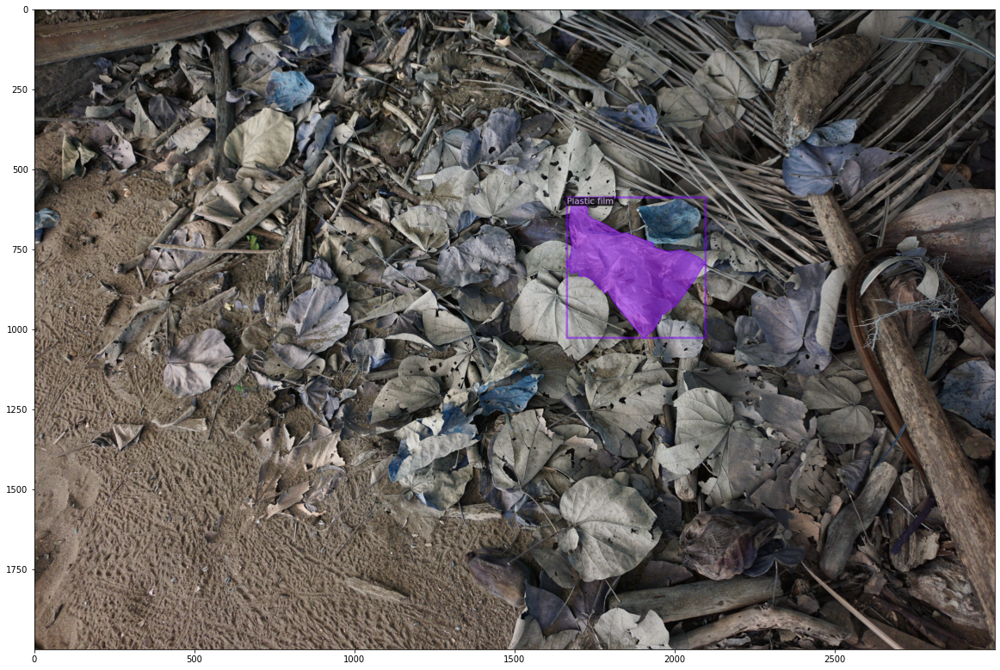

In [153]:
#visualize training data

my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

for d in random.sample(dataset_dicts, 1):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    fig = plt.figure(figsize=(20,20))
    plt.imshow(vis.get_image()[:, :, ::-1])

In [154]:
steps_per_epoch=annot_df.shape[0]//4

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_test",)
cfg.MODEL.DEVICE='cuda' if torch.cuda.is_available() else 'cpu'
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.WARMUP_ITERS = 10
cfg.SOLVER.MAX_ITER = steps_per_epoch*10 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (steps_per_epoch*8,)
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 1024
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 60
cfg.TEST.EVAL_PERIOD=0
cfg.OUTPUT_DIR = "/home/work/Recycling/detectron_res"
cfg.OUTPUT_DIR_BEST ="/home/work/Recycling/detectron_res"
cfg.SOLVER.AMP.ENABLED = True
cfg.SEED = 1234

In [35]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            os.makedirs("coco_eval", exist_ok=True)
            output_folder = "coco_eval"
        return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [36]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[10/24 13:47:05 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (61, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (61,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (240, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (240,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bi

[10/24 13:47:09 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.8/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
/usr/local/lib/python3.8/dist-packages/torch/optim/

[10/24 13:48:25 d2.utils.events]:  eta: 11:43:22  iter: 19  total_loss: 1.181  loss_cls: 0.8442  loss_box_reg: 0.0414  loss_rpn_cls: 0.1704  loss_rpn_loc: 0.04982  time: 3.4455  data_time: 0.0975  lr: 0.001  max_mem: 6476M
[10/24 13:49:27 d2.utils.events]:  eta: 11:00:23  iter: 39  total_loss: 0.4352  loss_cls: 0.2312  loss_box_reg: 0.06914  loss_rpn_cls: 0.07524  loss_rpn_loc: 0.02763  time: 3.2833  data_time: 0.0163  lr: 0.001  max_mem: 6476M
[10/24 13:50:28 d2.utils.events]:  eta: 10:49:13  iter: 59  total_loss: 0.3437  loss_cls: 0.1529  loss_box_reg: 0.08557  loss_rpn_cls: 0.04812  loss_rpn_loc: 0.03439  time: 3.1916  data_time: 0.0180  lr: 0.001  max_mem: 6476M
[10/24 13:51:27 d2.utils.events]:  eta: 10:43:32  iter: 79  total_loss: 0.3546  loss_cls: 0.153  loss_box_reg: 0.09698  loss_rpn_cls: 0.0499  loss_rpn_loc: 0.01963  time: 3.1310  data_time: 0.0167  lr: 0.001  max_mem: 6476M
[10/24 13:52:29 d2.utils.events]:  eta: 10:44:11  iter: 99  total_loss: 0.3458  loss_cls: 0.144  loss

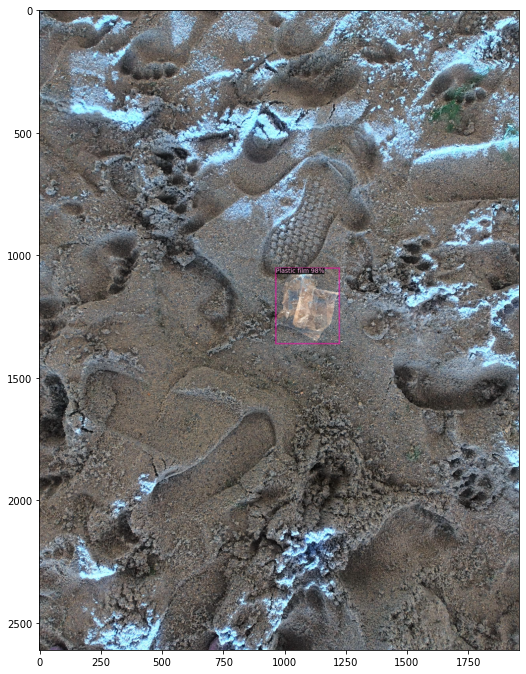

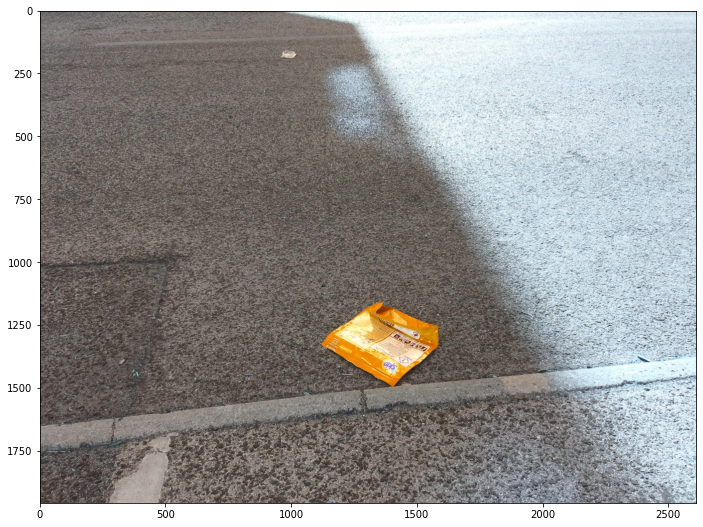

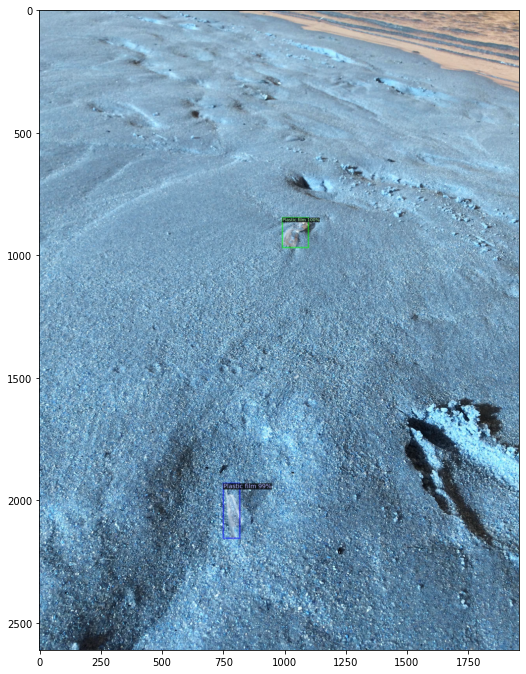

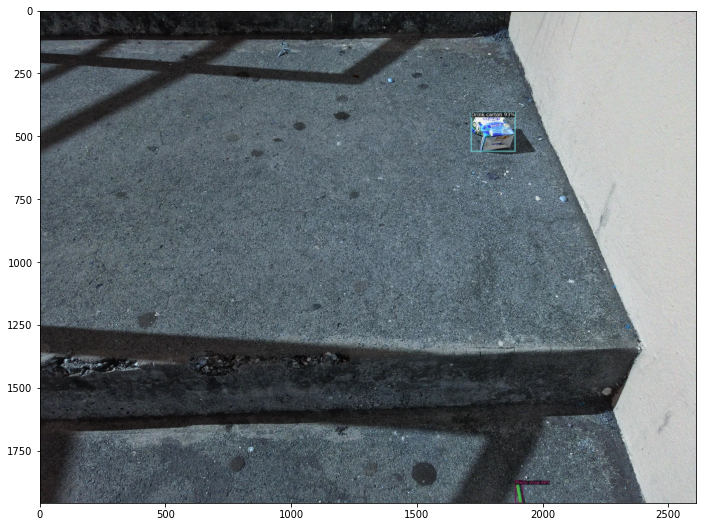

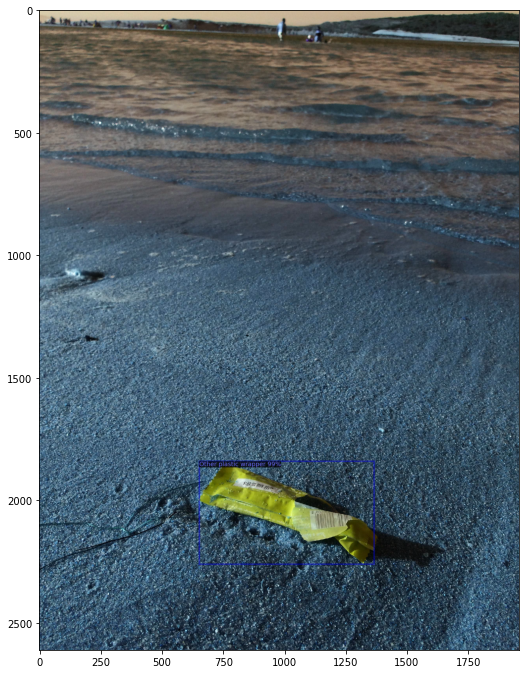

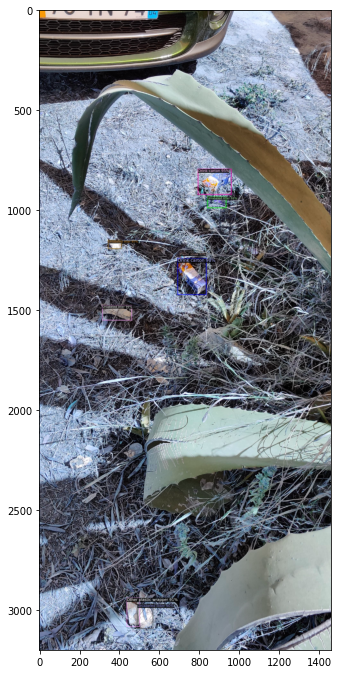

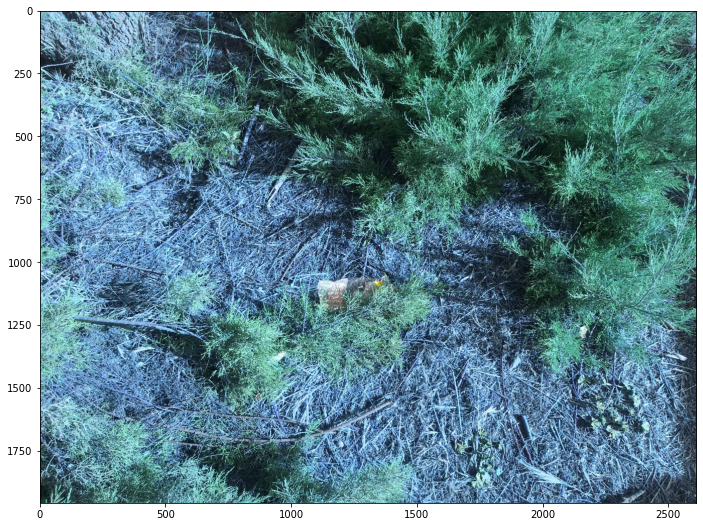

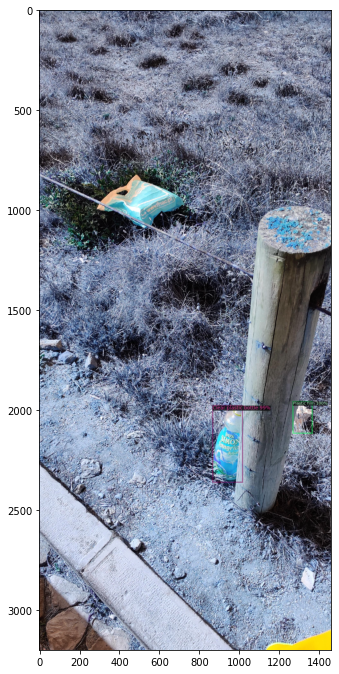

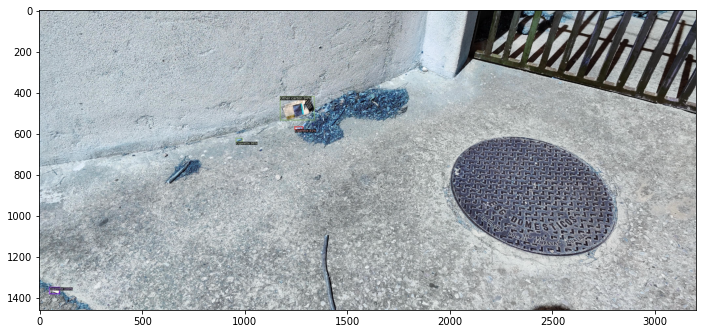

In [99]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

from detectron2.utils.visualizer import ColorMode
import glob


columns = 3
rows = 3

images = glob.glob('/home/work/Recycling/data/batch_9/*jpg')

for i in range(1, columns*rows +1):
    fig = plt.figure(figsize=(40,40))
    fig.add_subplot(rows, columns, i)
    for image in random.sample(images, 9):
        im = cv2.imread(image)
        outputs = predictor(im)
        v = Visualizer(im[:, :, ::-1], metadata=test_metadata, scale=0.8)
        out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        plt.imshow(out.get_image()[:, :, ::-1])
plt.show()

# Mask RCNN

#### Kfold 

In [ ]:
class RepeatedStratifiedGroupKFold():
    #use kfold to improve the average precision score. 
    #This code part was taken from this page https://meeywood.com/hkxegav/detectron2-cross-validation 
    # and also https://stackoverflow.com/questions/64164932/stratified-k-fold-for-multi-class-object-detection

    def __init__(self, n_splits=5, n_repeats=1, random_state=None):
        self.n_splits = n_splits
        self.n_repeats = n_repeats
        self.random_state = random_state
        
    def split(self, X, y=None, groups=None):
        k = self.n_splits
        def eval_y_counts_per_fold(y_counts, fold):
            y_counts_per_fold[fold] += y_counts
            std_per_label = []
            for label in range(labels_num):
                label_std = np.std(
                    [y_counts_per_fold[i][label] / y_distr[label] for i in range(k)]
                )
                std_per_label.append(label_std)
            y_counts_per_fold[fold] -= y_counts
            return np.mean(std_per_label)
            
        rnd = check_random_state(self.random_state)
        for repeat in range(self.n_repeats):
            #print(np.max(y))
            labels_num = np.max(y) + 1
            y_counts_per_group = defaultdict(lambda: np.zeros(labels_num))
            y_distr = Counter()
            for label, g in zip(y, groups):
                y_counts_per_group[g][label] += 1
                y_distr[label] += 1

            y_counts_per_fold = defaultdict(lambda: np.zeros(labels_num))
            groups_per_fold = defaultdict(set)
        
            groups_and_y_counts = list(y_counts_per_group.items())
            rnd.shuffle(groups_and_y_counts)

            for g, y_counts in sorted(groups_and_y_counts, key=lambda x: -np.std(x[1])):
                best_fold = None
                min_eval = None
                for i in range(k):
                    fold_eval = eval_y_counts_per_fold(y_counts, i)
                    if min_eval is None or fold_eval < min_eval:
                        min_eval = fold_eval
                        best_fold = i
                y_counts_per_fold[best_fold] += y_counts
                groups_per_fold[best_fold].add(g)
            
            all_groups = set(groups)
            for i in range(k):
                train_groups = all_groups - groups_per_fold[i]
                test_groups = groups_per_fold[i]

                train_indices = [i for i, g in enumerate(groups) if g in train_groups]
                test_indices = [i for i, g in enumerate(groups) if g in test_groups]

                yield train_indices, test_indices

In [ ]:
def kfold_split(config,df): #also taken from previous sources
    df["folds"]=-1
    kf = RepeatedStratifiedGroupKFold(n_splits=config.general["n_folds"], random_state=config.general["seed"])
    for fold, (_, val_index) in enumerate(kf.split(df,df.category_id, df.image_id)):
            df.loc[val_index, "folds"] = fold
    return df

#### Albumentations

In [156]:
#This was taken from the ALBUMENTATIONS package page https://albumentations.ai/docs/getting_started/mask_augmentation/
#and with help of the kaggle notebook https://www.kaggle.com/corochann/vinbigdata-detectron2-train

def get_train_transforms():
    return A.Compose(
        [
            A.OneOf([
                A.HueSaturationValue(hue_shift_limit=0.1, sat_shift_limit= 0.1, 
                                     val_shift_limit=0.1, p=0.8),
                A.RandomBrightnessContrast(brightness_limit=0.3, 
                                           contrast_limit=0.2, p=0.8),
            ],p=0.7),
            A.Rotate (limit=15, interpolation=1, border_mode=4, value=None, mask_value=None, p=0.8),
            
            
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomResizedCrop (1500, 1500, scale=(0.8, 0.8), ratio=(0.75, 1.3333333333333333), interpolation=1, always_apply=False, p=0.1),
            A.OneOf([
            A.Resize(height=1500, width=1500, p=0.2),
            A.LongestMaxSize(max_size=1500, p=0.2),
            A.SmallestMaxSize(max_size=1000, p=0.2),
                
            ], p=1),
            A.CLAHE(clip_limit=[1,4],p=1),
            
        ], 
        
        p=1.0, 
        
        bbox_params=A.BboxParams(
            format='coco',
            min_area=0.5, 
            min_visibility=0.5,
            label_fields=['category_id'] #just change where the labels are taken from
        )
    )


def get_valid_transforms():
    return A.Compose(
        [
            A.SmallestMaxSize(max_size=1000, p=1.0),
            A.CLAHE(clip_limit=[3,3],p=1),   
        ], 
         p=1.0, 
        
        #Note that unlike image and masks augmentation, Compose now has an additional parameter bbox_params. You need to pass 
        #an instance of A.BboxParams to that argument. A.BboxParams specifies settings for working with bounding boxes.format
        bbox_params=A.BboxParams(
            format='coco',
            min_area=0.5, 
            min_visibility=0.5,
            label_fields=['category_id']#same here
        )
    )

def get_transforms(train=True):
    if (train):
        return get_train_transforms()#apply to train
    return get_valid_transforms()#apply to valid

#direct function
albu_transformations=get_transforms(train=True)

In [ ]:
class PersonalMapper (detectron2.data.DatasetMapper): 
    #Define a detectron2 personal mapper in order to be able to use albumentation augmentations
    #This was taken from the Detectron2 documentations and Albumentations package page:
    #https://detectron2.readthedocs.io/en/latest/tutorials/augmentation.html
    #https://albumentations.ai/docs/examples/example_bboxes/
    def __call__(self, dataset_dict):

        dataset_dict = copy.deepcopy(dataset_dict) 
        image = utils.read_image(dataset_dict["file_name"], format=self.image_format)
        annos = [
            obj for obj in dataset_dict["annotations"]
        ]
        annos_bbox = [
            obj["bbox"] for obj in dataset_dict["annotations"]
        ]
        annos_categroy_id = [
            obj["category_id"] for obj in dataset_dict.pop("annotations")
        ]
        
        if albu_transformations is not None:
            transform_list=get_transforms(self.is_train)
            image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            transform_result=transform_list(image=image,bboxes=annos_bbox,category_id=annos_categroy_id)
            image=cv2.cvtColor(transform_result["image"], cv2.COLOR_RGB2BGR)
            annos=[annos[i] for i in range(len(transform_result["bboxes"]))]
            for i in range(len(annos)):
                annos[i]["bbox"]=list(transform_result["bboxes"][i])
                annos[i]["category_id"]=transform_result["category_id"][i]
        
        dataset_dict["annotations"]=annos
        if "sem_seg_file_name" in dataset_dict:
            sem_seg_gt = utils.read_image(dataset_dict.pop("sem_seg_file_name"), "L").squeeze(2)
        else:
            sem_seg_gt = None

        aug_input = T.AugInput(image, sem_seg=sem_seg_gt)
        transforms = self.augmentations(aug_input)
        image, sem_seg_gt = aug_input.image, aug_input.sem_seg

        image_shape = image.shape[:2] 
        dataset_dict["image"] = torch.as_tensor(np.ascontiguousarray(image.transpose(2, 0, 1)))
        if sem_seg_gt is not None:
            dataset_dict["sem_seg"] = torch.as_tensor(sem_seg_gt.astype("long"))

        if self.proposal_topk is not None:
            utils.transform_proposals(
                dataset_dict, image_shape, transforms, proposal_topk=self.proposal_topk
            )

        if not self.is_train:
            dataset_dict.pop("annotations", None)
            dataset_dict.pop("sem_seg_file_name", None)
            return dataset_dict

        if "annotations" in dataset_dict:
            for anno in dataset_dict["annotations"]:
                if not self.use_instance_mask:
                    anno.pop("segmentation", None)
                if not self.use_keypoint:
                    anno.pop("keypoints", None)

            annos = [
                utils.transform_instance_annotations(
                    obj, transforms, image_shape, keypoint_hflip_indices=self.keypoint_hflip_indices
                )
                for obj in dataset_dict.pop("annotations")
                if obj.get("iscrowd", 0) == 0
            ]
            instances = utils.annotations_to_instances(
                annos, image_shape, mask_format=self.instance_mask_format
            )
            if self.recompute_boxes:
                instances.gt_boxes = instances.gt_masks.get_bounding_boxes()
            dataset_dict["instances"] = utils.filter_empty_instances(instances)
        return dataset_dict

In [166]:
steps_per_epoch=annot_df.shape[0]//4 #recommended configuration

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_DC5_3x.yaml"))#Use model zoo to get
#an instance segmentation model
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_test",)
cfg.MODEL.DEVICE='cuda' if torch.cuda.is_available() else 'cpu'
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_DC5_3x.yaml")  
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.01
cfg.SOLVER.WARMUP_ITERS = 10
cfg.SOLVER.MAX_ITER = steps_per_epoch*5 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (steps_per_epoch*4,)
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 1024
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 60 #all the classes
cfg.TEST.EVAL_PERIOD=0
cfg.OUTPUT_DIR = "/home/work/Recycling/detectron_res"
cfg.OUTPUT_DIR_BEST ="/home/work/Recycling/detectron_res"
cfg.SOLVER.AMP.ENABLED = True
cfg.SEED = 1234

In [ ]:
class PersonalTrainer (detectron2.engine.defaults.DefaultTrainer): #change data loaders since we are using albumentations
    #taken from  https://towardsdatascience.com/how-to-train-detectron2-on-custom-object-detection-data-be9d1c233e4
    # and https://www.analyticsvidhya.com/blog/2021/08/your-guide-to-object-detection-with-detectron2-in-pytorch/
    
    def __init__(self, cfg):
        super().__init__(cfg)
        self.metric=0
        self.checkpointer.save_dir=MODELS_PATH

    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg,mapper=PersonalMapper(cfg,is_train=True,augmentations=[]))
    @classmethod
    def build_test_loader(cls, cfg, dataset_name):
        return build_detection_test_loader( cfg,dataset_name,mapper=PersonalMapper(cfg,is_train=False,augmentations=[]))
    
    @classmethod
    def build_evaluator(cls, cfg, dataset_name):
        return COCOEvaluator(dataset_name, ("bbox",), False, output_dir=None)

In [168]:
register_dataset(fold)
cfg=get_config(fold)
trainer = PersonalTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.evaluator = COCOEvaluator(f"my_dataset_test_{fold}", ("bbox",), False, output_dir=None)
trainer.train()

[10/25 10:35:13 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_0464b7.pkl: 766MB [00:52, 14.5MB/s]                               
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (61, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (61,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (240, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (240,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the mode

[10/25 10:36:07 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.8/dist-packages/torch/optim/lr_scheduler.py:129: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


ERROR [10/25 10:36:11 d2.engine.train_loop]: Exception during training:
Traceback (most recent call last):
  File "/home/work/Recycling/detectron2/detectron2/engine/train_loop.py", line 149, in train
    self.run_step()
  File "/home/work/Recycling/detectron2/detectron2/engine/defaults.py", line 494, in run_step
    self._trainer.run_step()
  File "/home/work/Recycling/detectron2/detectron2/engine/train_loop.py", line 395, in run_step
    loss_dict = self.model(data)
  File "/usr/local/lib/python3.8/dist-packages/torch/nn/modules/module.py", line 1051, in _call_impl
    return forward_call(*input, **kwargs)
  File "/home/work/Recycling/detectron2/detectron2/modeling/meta_arch/rcnn.py", line 163, in forward
    _, detector_losses = self.roi_heads(images, features, proposals, gt_instances)
  File "/usr/local/lib/python3.8/dist-packages/torch/nn/modules/module.py", line 1051, in _call_impl
    return forward_call(*input, **kwargs)
  File "/home/work/Recycling/detectron2/detectron2/modelin

RuntimeError: CUDA out of memory. Tried to allocate 784.00 MiB (GPU 0; 7.94 GiB total capacity; 6.19 GiB already allocated; 215.67 MiB free; 6.71 GiB reserved in total by PyTorch)

### Since the model could not be processed in the university servers (due to us also training the YoloV5 model) it was moved to Kaggle. The only disadvantage with Kaggle is that, when downloading the notebook, it doesn't include the outputs.